In [176]:
import os
import glob
import cv2
import datetime
import pandas as pd
import time
import warnings
import multiprocessing
import h5py
from subprocess import check_output

warnings.filterwarnings("ignore")

os.environ['THEANO_FLAGS'] = "device=gpu2,floatX=float32"   
import theano
from keras.models import Sequential
from keras.layers import BatchNormalization
from keras.optimizers import SGD, Adagrad
from keras.callbacks import EarlyStopping
from keras.utils import np_utils
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, MaxPooling2D, BatchNormalization
from keras import backend as K

from sklearn.metrics import log_loss
from sklearn.cross_validation import KFold
from sklearn.cluster import DBSCAN
import matplotlib.pylab as plt
from scipy.misc import imread
import numpy as np
import seaborn as sns
import random
np.random.seed(2017)

plt.style.use("ggplot")
%matplotlib inline

<function keras.backend.backend>

In [57]:
data_dir = "train"
fish_folders = ["ALB","BET","DOL","LAG","SHARK","YFT","NoF","OTHER"]
fish_names = {"ALB"   : "Albacore Tuna",
              "BET"   : "Bigeye Tuna",
              "DOL"   : "Dolphinfish",
              "LAG"   : "Opah, Moonfish",
              "SHARK" : "Shark",
              "YFT"   : "Yellowfin Tuna",
              "NoF"   : "No Fish",
              "OTHER" : "Other"}
num_display_images = 5

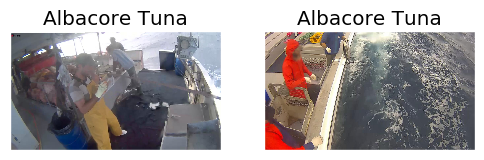

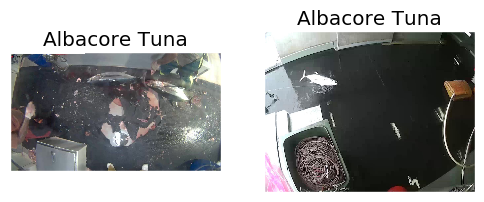

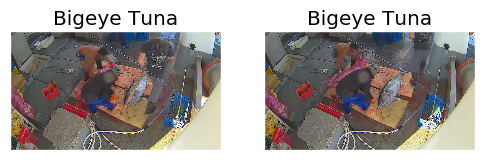

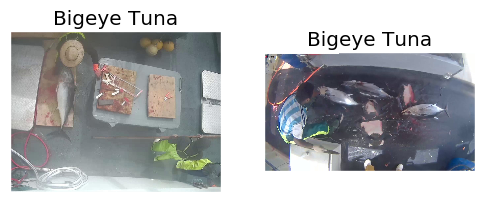

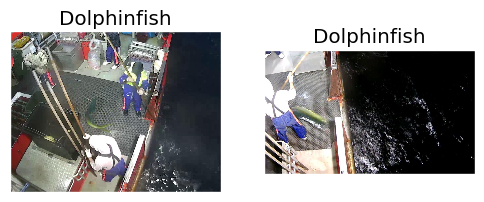

...

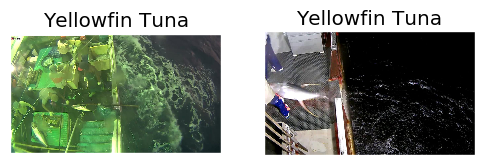

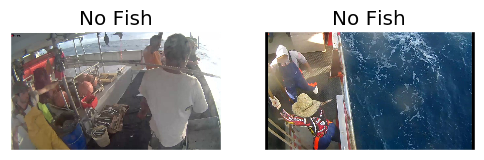

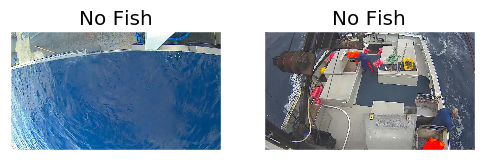

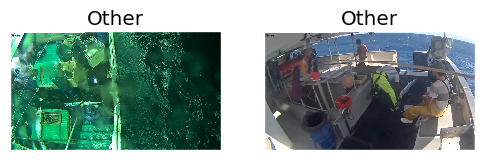

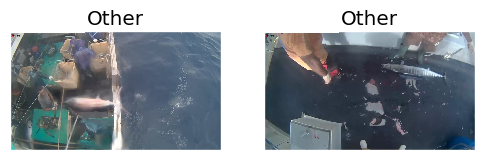

In [58]:
for fish in fish_folders:
    cur_folder = '/'.join([data_dir,fish])
    img_files  = os.listdir(cur_folder)
    img_nums   = np.round(np.random.random_sample(num_display_images) * len(img_files)).astype(int)
    img_count  = 0
    for row in range(num_display_images//2):
        fig,ax = plt.subplots(nrows=1,ncols=2)
        for j in range(2):
            img_file = '/'.join([cur_folder,img_files[img_nums[img_count]]])
            ax[j].imshow(imread(img_file))
            img_count += 1
            ax[j].set_xticks([]) 
            ax[j].set_yticks([])
            ax[j].set_title(fish_names[fish])
        plt.show()

Number of files for the species ALB : 1719
Number of files for the species BET : 200
Number of files for the species DOL : 117
Number of files for the species LAG : 67
Number of files for the species NoF : 465
Number of files for the species OTHER : 299
Number of files for the species SHARK : 176
Number of files for the species YFT : 734


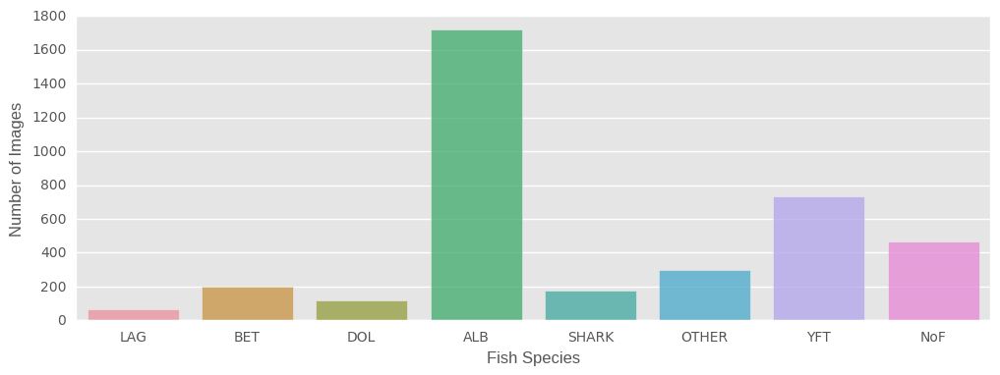

In [78]:
sub_folders = check_output(["ls", "train/"]).decode("utf8").strip().split('\n')
count_dict = {}
for sub_folder in sub_folders:
    num_of_files = len(check_output(["ls", "train/"+sub_folder]).decode("utf8").strip().split('\n'))
    print("Number of files for the species",sub_folder,":",num_of_files)
    count_dict[sub_folder] = num_of_files
    
plt.figure(figsize=(12,4))
sns.barplot(list(count_dict.keys()), list(count_dict.values()), alpha=0.8)
plt.xlabel('Fish Species', fontsize=12)
plt.ylabel('Number of Images', fontsize=12)
plt.show()

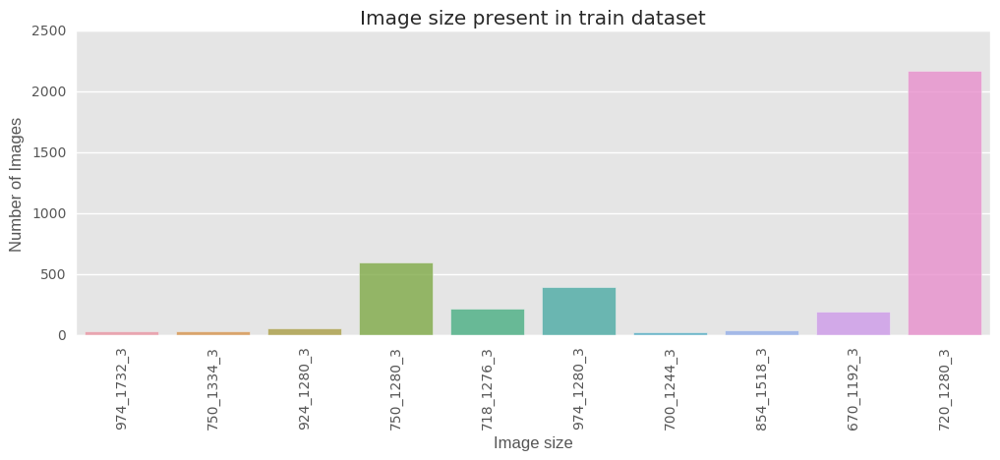

In [79]:
train_path = "train/"
sub_folders = check_output(["ls", train_path]).decode("utf8").strip().split('\n')
different_file_sizes = {}
for sub_folder in sub_folders:
    file_names = check_output(["ls", train_path+sub_folder]).decode("utf8").strip().split('\n')
    for file_name in file_names:
        im_array = imread(train_path+sub_folder+"/"+file_name)
        size = "_".join(map(str,list(im_array.shape)))
        different_file_sizes[size] = different_file_sizes.get(size,0) + 1

plt.figure(figsize=(12,4))
sns.barplot(list(different_file_sizes.keys()), list(different_file_sizes.values()), alpha=0.8)
plt.xlabel('Image size', fontsize=12)
plt.ylabel('Number of Images', fontsize=12)
plt.title("Image size present in train dataset")
plt.xticks(rotation='vertical')
plt.show()

* Посмотрев на распределение классов в трейн сете, сразу появляются идеи, что можно сделать
* Boat clustering
* Day\Night
* Different nets

In [111]:
def get_im_cv2(path):
    img = cv2.imread(path)
    resized = cv2.resize(img, (128, 128), cv2.INTER_LINEAR)
    return resized


def load_train():
    X_train = []
    X_train_id = []
    y_train = []
    start_time = time.time()

    print('Read train images')
    folders = ['ALB', 'BET', 'DOL', 'LAG', 'NoF', 'OTHER', 'SHARK', 'YFT']
    for fld in folders:
        index = folders.index(fld)
        print('Load folder {} (Index: {})'.format(fld, index))
        path = os.path.join('train', fld, '*.jpg')
        files = glob.glob(path)
        for fl in files:
            flbase = os.path.basename(fl)
            img = get_im_cv2(fl)
            X_train.append(img)
            X_train_id.append(flbase)
            y_train.append(index)

    print('Read train data time: {} seconds'.format(round(time.time() - start_time, 2)))
    return X_train, y_train, X_train_id


def load_test():
    path = os.path.join('test', '*.jpg')
    files = sorted(glob.glob(path))

    X_test = []
    X_test_id = []
    for fl in files:
        flbase = os.path.basename(fl)
        img = get_im_cv2(fl)
        X_test.append(img)
        X_test_id.append(flbase)

    return X_test, X_test_id


def create_submission(predictions, test_id, info):
    result1 = pd.DataFrame(predictions, columns=['ALB', 'BET', 'DOL', 'LAG', 'NoF', 'OTHER', 'SHARK', 'YFT'])
    result1.loc[:, 'image'] = pd.Series(test_id, index=result1.index)
    now = datetime.datetime.now()
    sub_file = 'submission_' + info + '_' + str(now.strftime("%Y-%m-%d-%H-%M")) + '.csv'
    result1.to_csv(sub_file, index=False)


def read_and_normalize_train_data():
    train_data, train_target, train_id = load_train()
    print('Convert to numpy...')
    train_data = np.array(train_data, dtype=np.uint8)
    train_target = np.array(train_target, dtype=np.uint8)

    print('Reshape...')
    train_data = train_data.transpose((0, 3, 1, 2))

    print('Convert to float...')
    train_data = train_data.astype('float32')
    train_data = train_data / 255
    train_target = np_utils.to_categorical(train_target, 8)

    print('Train shape:', train_data.shape)
    print(train_data.shape[0], 'train samples')
    return train_data, train_target, train_id


def read_and_normalize_test_data():
    start_time = time.time()
    test_data, test_id = load_test()

    test_data = np.array(test_data, dtype=np.uint8)
    test_data = test_data.transpose((0, 3, 1, 2))

    test_data = test_data.astype('float32')
    test_data = test_data / 255

    print('Test shape:', test_data.shape)
    print(test_data.shape[0], 'test samples')
    print('Read and process test data time: {} seconds'.format(round(time.time() - start_time, 2)))
    return test_data, test_id

def res_vis(history, metric):
    plt.figure()
    plt.plot(history.history[metric])
    plt.plot(history.history["val_loss"])
    plt.title('performance', fontsize=10)
    plt.ylabel(metric, fontsize=8)
    plt.xlabel('epoch', fontsize=8)
    plt.legend(['train', 'test'], loc=1, fontsize=8)

In [38]:
def simple_cnn():
    model = Sequential()

    model.add(Convolution2D(nb_filters, kernel_size[0], kernel_size[1], border_mode='valid', 
                            input_shape=input_shape, dim_ordering='th'))
    model.add(Activation('relu'))
    model.add(Convolution2D(nb_filters, kernel_size[0], kernel_size[1],dim_ordering='th'))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=pool_size,dim_ordering='th'))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(128))
    model.add(Activation('relu'))
    model.add(Dropout(0.5))
    model.add(Dense(nb_classes))
    model.add(Activation('softmax'))

    model.compile(loss='categorical_crossentropy',
                  optimizer='adadelta',
                  metrics=['accuracy'])
    return model

In [39]:
#keras parameters
batch_size = 128
nb_classes = 8
nb_epoch = 12

# input image dimensions
img_rows, img_cols = 48, 48
# number of convolutional filters to use
nb_filters = 32
# size of pooling area for max pooling
pool_size = (2, 2)
# convolution kernel size
kernel_size = (3, 3)

train_data, train_target, train_id = load_train()
test_data, test_id = load_test()

X_train = np.array(train_data, dtype=np.uint8)
y_train = np.array(train_target, dtype=np.uint8)
X_train = X_train.transpose((0, 3, 1, 2))
Y_train = np_utils.to_categorical(y_train, nb_classes)

X_test = np.array(test_data, dtype=np.uint8)
X_test = X_test.transpose((0, 3, 1, 2))

# Normalizing the data
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')
X_train /= 255
X_test /= 255
print('X_train shape:', X_train.shape)
print(X_train.shape[0], 'train samples')
print(X_test.shape[0], 'test samples')

folders = ['ALB', 'BET', 'DOL', 'LAG', 'NoF', 'OTHER', 'SHARK', 'YFT']

Read train images
Load folder ALB (Index: 0)
Load folder BET (Index: 1)
Load folder DOL (Index: 2)
Load folder LAG (Index: 3)
Load folder NoF (Index: 4)
Load folder OTHER (Index: 5)
Load folder SHARK (Index: 6)
Load folder YFT (Index: 7)
Read train data time: 51.56 seconds
X_train shape: (3777, 3, 48, 48)
3777 train samples
1000 test samples


Epoch 1/12
14s - loss: 1.6021 - acc: 0.4551
Epoch 2/12
13s - loss: 1.3580 - acc: 0.5359
Epoch 3/12
13s - loss: 1.1637 - acc: 0.5923
Epoch 4/12
13s - loss: 0.9341 - acc: 0.6826
Epoch 5/12
13s - loss: 0.7216 - acc: 0.7559
Epoch 6/12
13s - loss: 0.5785 - acc: 0.8094
Epoch 7/12
13s - loss: 0.4629 - acc: 0.8552
Epoch 8/12
13s - loss: 0.3883 - acc: 0.8798
Epoch 9/12
13s - loss: 0.3019 - acc: 0.9089
Epoch 10/12
13s - loss: 0.2464 - acc: 0.9309
Epoch 11/12
13s - loss: 0.2159 - acc: 0.9341
Epoch 12/12
13s - loss: 0.1853 - acc: 0.9447


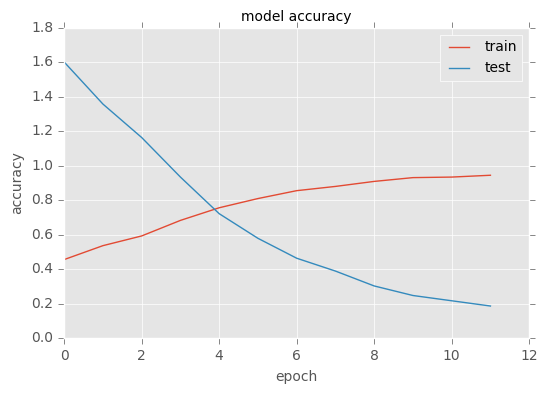

In [42]:
input_shape = (3, img_rows, img_cols)
cnn = simple_cnn()

hist = cnn.fit(X_train, Y_train, batch_size=batch_size, nb_epoch=12, verbose=2)
res_vis(hist, "acc")

In [133]:
def dict_to_list(d):
    ret = []
    for i in d.items():
        ret.append(i[1])
    return ret


def merge_several_folds_mean(data, nfolds):
    a = np.array(data[0])
    for i in range(1, nfolds):
        a += np.array(data[i])
    a /= nfolds
    return a.tolist()

def get_validation_predictions(train_data, predictions_valid):
    pv = []
    for i in range(len(train_data)):
        pv.append(predictions_valid[i])
    return pv


def run_cross_validation_create_models(model, train_data, train_target, train_id, nfolds=10):
    # input image dimensions
    batch_size = 24
    nb_epoch = 15
    random_state = 51
    first_rl = 96

    yfull_train = dict()
    kf = KFold(len(train_id), n_folds=nfolds, shuffle=True, random_state=random_state)
    num_fold = 0
    sum_score = 0
    models = []
    history = []
    for train_index, test_index in kf:
        X_train = train_data[train_index]
        Y_train = train_target[train_index]
        X_valid = train_data[test_index]
        Y_valid = train_target[test_index]

        num_fold += 1
        print('Start KFold number {} from {}'.format(num_fold, nfolds))
        print('Split train: ', len(X_train), len(Y_train))
        print('Split valid: ', len(X_valid), len(Y_valid))

        callbacks = [
            EarlyStopping(monitor='val_loss', patience=3, verbose=0),
        ]
        hist = model.fit(X_train, Y_train, batch_size=batch_size, nb_epoch=nb_epoch,
              shuffle=True, verbose=2, validation_data=(X_valid, Y_valid),
              callbacks=callbacks)

        predictions_valid = model.predict(X_valid.astype('float32'), batch_size=batch_size, verbose=2)
        score = log_loss(Y_valid, predictions_valid)
        print('Score log_loss: ', score)
        sum_score += score*len(test_index)

        # Store valid predictions
        for i in range(len(test_index)):
            yfull_train[test_index[i]] = predictions_valid[i]

        models.append(model)
        history.append(hist)

    score = sum_score/len(train_data)
    print("Log_loss train independent avg: ", score)

    info_string = 'loss_' + str(score) + '_folds_' + str(nfolds) + '_ep_' + str(nb_epoch) + '_fl_' + str(first_rl)
    return info_string, models, history


def run_cross_validation_process_test(info_string, models, test_data, test_id):
    batch_size = 24
    num_fold = 0
    yfull_test = []
    test_id = []
    nfolds = len(models)

    for i in range(nfolds):
        model = models[i]
        num_fold += 1
        print('Start KFold number {} from {}'.format(num_fold, nfolds))
        test_data, test_id = read_and_normalize_test_data(train_data, train_target, train_id)
        test_prediction = model.predict(test_data, batch_size=batch_size, verbose=2)
        yfull_test.append(test_prediction)

    test_res = merge_several_folds_mean(yfull_test, nfolds)
    info_string = 'loss_' + info_string \
                + '_folds_' + str(nfolds)
    create_submission(test_res, test_id, info_string)

In [112]:
train_data_, train_target_, train_id_ = read_and_normalize_train_data()

Read train images
Load folder ALB (Index: 0)
Load folder BET (Index: 1)
Load folder DOL (Index: 2)
Load folder LAG (Index: 3)
Load folder NoF (Index: 4)
Load folder OTHER (Index: 5)
Load folder SHARK (Index: 6)
Load folder YFT (Index: 7)
Read train data time: 52.26 seconds
Convert to numpy...
Reshape...
Convert to float...
Train shape: (3777, 3, 128, 128)
3777 train samples


Read train images
Load folder ALB (Index: 0)
Load folder BET (Index: 1)
Load folder DOL (Index: 2)
Load folder LAG (Index: 3)
Load folder NoF (Index: 4)
Load folder OTHER (Index: 5)
Load folder SHARK (Index: 6)
Load folder YFT (Index: 7)
Read train data time: 51.62 seconds
Convert to numpy...
Reshape...
Convert to float...
Train shape: (3777, 3, 48, 48)
3777 train samples
Start KFold number 1 from 3
Split train:  2518 2518
Split valid:  1259 1259
Train on 2518 samples, validate on 1259 samples
Epoch 1/15
13s - loss: 0.0187 - acc: 0.9948 - val_loss: 0.0049 - val_acc: 0.9992
Epoch 2/15
13s - loss: 0.0102 - acc: 0.9972 - val_loss: 0.0057 - val_acc: 0.9992
Epoch 3/15
13s - loss: 0.0119 - acc: 0.9972 - val_loss: 0.0064 - val_acc: 0.9992
Epoch 4/15
13s - loss: 0.0078 - acc: 0.9984 - val_loss: 0.0060 - val_acc: 0.9992
Epoch 5/15
13s - loss: 0.0131 - acc: 0.9952 - val_loss: 0.0070 - val_acc: 0.9984
Score log_loss:  0.00704014339858
Start KFold number 2 from 3
Split train:  2518 2518
Split vali

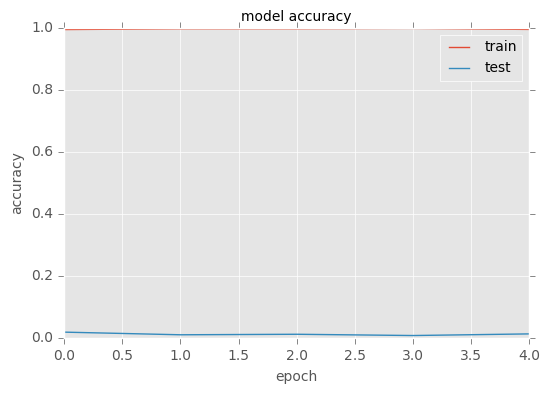

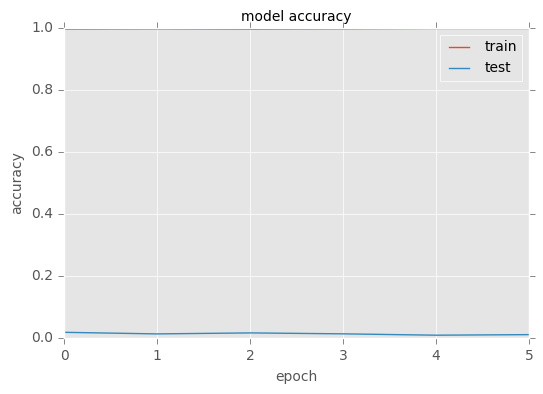

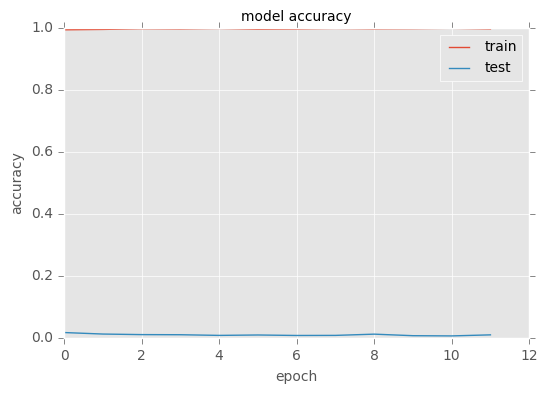

In [45]:
num_folds = 3
info_string, models, hists = run_cross_validation_create_models(cnn, num_folds)
run_cross_validation_process_test(info_string, models)

for cur_model in hists:
    res_vis(cur_model, "loss")

In [132]:
def cnn():
    model = Sequential()
    #model.add(ZeroPadding2D((1, 1), input_shape=(3, 48, 48), dim_ordering='th'))
    model.add(Convolution2D(4, 3, 3, input_shape=(3, 48, 48),activation='relu', dim_ordering='th',init='he_uniform'))
    #model.add(ZeroPadding2D((1, 1), dim_ordering='th'))
    model.add(Convolution2D(4, 3, 3, activation='relu', dim_ordering='th',init='he_uniform'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), dim_ordering='th'))
    
    #model.add(ZeroPadding2D((1, 1), dim_ordering='th'))
    model.add(Convolution2D(8, 3, 3, activation='relu', dim_ordering='th',init='he_uniform'))
    #model.add(ZeroPadding2D((1, 1), dim_ordering='th'))
    model.add(Convolution2D(8, 3, 3, activation='relu', dim_ordering='th',init='he_uniform'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), dim_ordering='th'))
    
    model.add(Flatten())
    model.add(Dense(96, activation='relu',init='he_uniform'))
    model.add(Dropout(0.515))
    model.add(Dense(16, activation='relu',init='he_uniform'))
    model.add(Dropout(0.515))
    model.add(Dense(8, activation='softmax'))

    sgd = SGD(lr=1e-2, decay=1e-6, momentum=0.898, nesterov=True)
    model.compile(optimizer=sgd, loss='categorical_crossentropy')

    return model

def cnn_batch():
    model = Sequential()
    #model.add(ZeroPadding2D((1, 1), input_shape=(3, 48, 48), dim_ordering='th'))
    model.add(Convolution2D(4, 3, 3, input_shape=input_shape,activation='relu', dim_ordering='th',init='he_uniform'))
    #model.add(ZeroPadding2D((1, 1), dim_ordering='th'))
    model.add(Convolution2D(4, 3, 3, activation='relu', dim_ordering='th',init='he_uniform'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), dim_ordering='th'))
    
    #model.add(ZeroPadding2D((1, 1), dim_ordering='th'))
    model.add(Convolution2D(8, 3, 3, activation='relu', dim_ordering='th',init='he_uniform'))
    #model.add(ZeroPadding2D((1, 1), dim_ordering='th'))
    model.add(Convolution2D(8, 3, 3, activation='relu', dim_ordering='th',init='he_uniform'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), dim_ordering='th'))
    
    model.add(Flatten())
    model.add(Dense(96, activation='relu',init='he_uniform'))
    model.add(BatchNormalization())
    model.add(Dense(16, activation='relu',init='he_uniform'))
    model.add(BatchNormalization())
    model.add(Dense(8, activation='softmax'))
    sgd = SGD(lr=1e-2, decay=1e-6, momentum=0.898, nesterov=True)
    model.compile(optimizer=sgd, loss='categorical_crossentropy')

    return model

In [48]:
num_folds = 3
cnn = cnn()
info_string, models, hists = run_cross_validation_create_models(cnn, num_folds)
run_cross_validation_process_test(info_string, models)

Read train images
Load folder ALB (Index: 0)
Load folder BET (Index: 1)
Load folder DOL (Index: 2)
Load folder LAG (Index: 3)
Load folder NoF (Index: 4)
Load folder OTHER (Index: 5)
Load folder SHARK (Index: 6)
Load folder YFT (Index: 7)
Read train data time: 51.57 seconds
Convert to numpy...
Reshape...
Convert to float...
Train shape: (3777, 3, 48, 48)
3777 train samples
Start KFold number 1 from 3
Split train:  2518 2518
Split valid:  1259 1259
Train on 2518 samples, validate on 1259 samples
Epoch 1/15
4s - loss: 1.7442 - val_loss: 1.6407
Epoch 2/15
3s - loss: 1.6233 - val_loss: 1.6092
Epoch 3/15
3s - loss: 1.5857 - val_loss: 1.5386
Epoch 4/15
3s - loss: 1.5632 - val_loss: 1.5314
Epoch 5/15
3s - loss: 1.5015 - val_loss: 1.4449
Epoch 6/15
3s - loss: 1.4477 - val_loss: 1.3518
Epoch 7/15
3s - loss: 1.3960 - val_loss: 1.2163
Epoch 8/15
3s - loss: 1.3311 - val_loss: 1.1506
Epoch 9/15
3s - loss: 1.2284 - val_loss: 1.0567
Epoch 10/15
3s - loss: 1.1765 - val_loss: 1.0016
Epoch 11/15
3s - los

TypeError: res_vis() missing 1 required positional argument: 'metric'

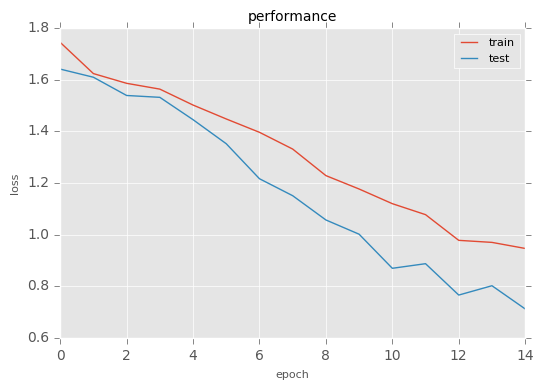

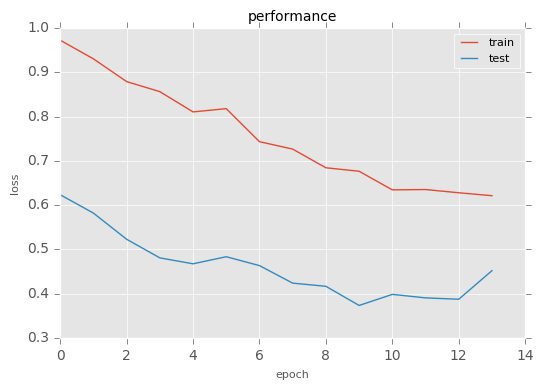

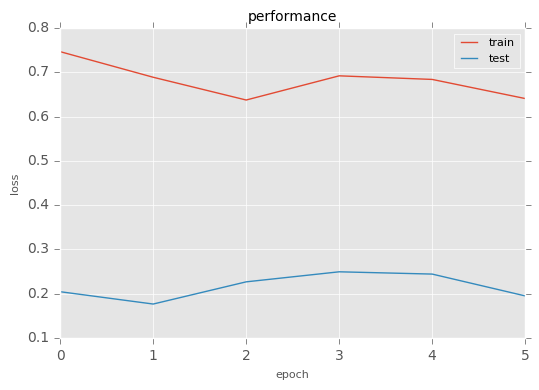

In [51]:
for cur_model in hists:
    res_vis(cur_model, "loss")

Start KFold number 1 from 5
Split train:  3021 3021
Split valid:  756 756
Train on 3021 samples, validate on 756 samples
Epoch 1/15
5s - loss: 1.4377 - val_loss: 1.2579
Epoch 2/15
3s - loss: 0.9427 - val_loss: 1.1254
Epoch 3/15
3s - loss: 0.7516 - val_loss: 1.0118
Epoch 4/15
3s - loss: 0.5953 - val_loss: 0.7045
Epoch 5/15
3s - loss: 0.4935 - val_loss: 0.6804
Epoch 6/15
3s - loss: 0.9797 - val_loss: 3.7884
Epoch 7/15
4s - loss: 1.1293 - val_loss: 3.1191
Epoch 8/15
3s - loss: 0.8528 - val_loss: 1.4315
Epoch 9/15
3s - loss: 0.8653 - val_loss: 1.0060
Score log_loss:  1.00599272907
Start KFold number 2 from 5
Split train:  3021 3021
Split valid:  756 756
Train on 3021 samples, validate on 756 samples
Epoch 1/15
4s - loss: 0.6277 - val_loss: 1.1331
Epoch 2/15
3s - loss: 0.5226 - val_loss: 0.6995
Epoch 3/15
3s - loss: 0.4464 - val_loss: 0.5604
Epoch 4/15
3s - loss: 0.3971 - val_loss: 0.5567
Epoch 5/15
3s - loss: 0.3443 - val_loss: 0.6322
Epoch 6/15
3s - loss: 0.3079 - val_loss: 0.5325
Epoch 7

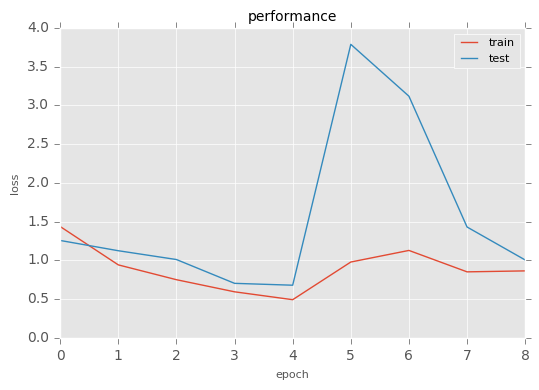

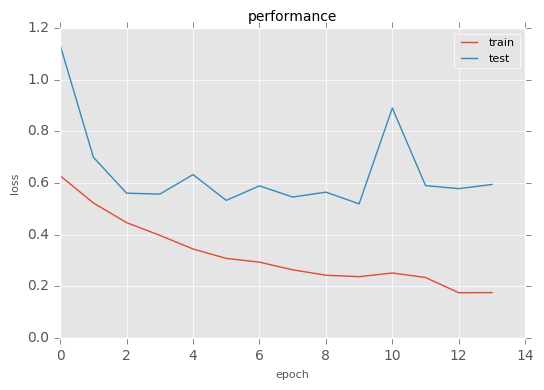

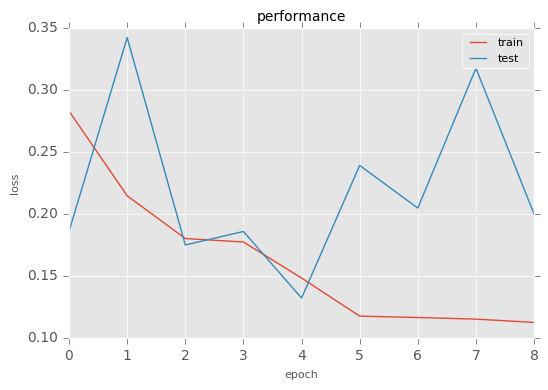

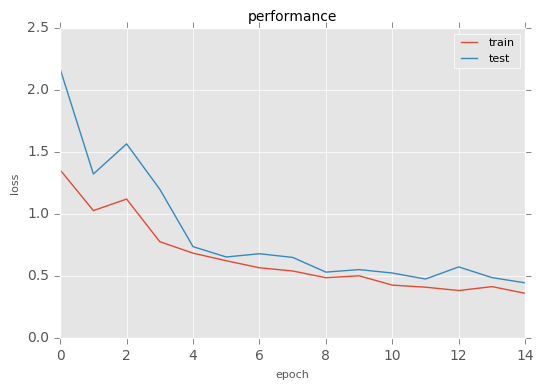

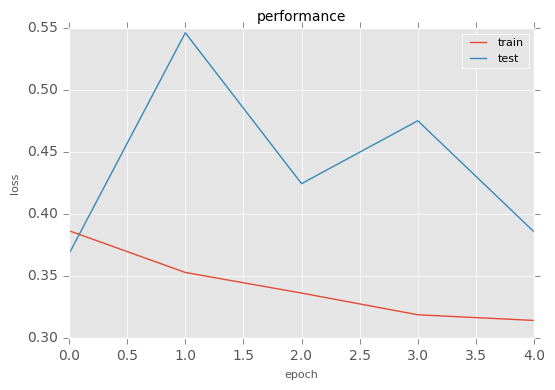

In [71]:
num_folds = 5
cnn = cnn_batch()
info_string, models, hists = run_cross_validation_create_models(cnn, train_data_, train_target_, train_id_, num_folds)
#run_cross_validation_process_test(info_string, models, test_data_, test_id_)

for cur_model in hists:
    res_vis(cur_model, "loss")

## BoatID clustering

In [83]:
num_select = 500
img_file = sorted(glob.glob('train/*/*.jpg'),
                  key=lambda x:random.random())[:num_select]
img = np.array([imread(img) for img in img_file])
print('Image Length : %d ' %(len(img)))

Image Length : 500 


In [85]:
def normalize_distance(args):
    img1,img2 = args
    img1= (img1 - img1.mean()) / img1.std() ## normalize = (value - mean) /standard deviation
    img2 = (img2 - img2.mean()) / img2.std() ## normalize = (value - mean)/standard deviation
    return (np.mean(np.abs(img1-img2)))


img_list = [cv2.resize(img_,(224,224),cv2.INTER_LINEAR) for img_ in img]
distance = np.zeros((len(img_list),len(img_list))) ## 500 * 500 dimension because the length of image is 500

# Create the distance matrix in a multithreaded fashion
pool = multiprocessing.Pool(16)
#bar = progressbar.ProgressBar(max=len(train))
distances = np.zeros((len(img_list), len(img_list)))
for i, img_ in enumerate(img_list): #enumerate(bar(train)):
    all_imgs = [(img_, f) for f in img_list]
    dists = pool.map(normalize_distance, all_imgs)
    distances[i, :] = dists

In [88]:
dbscan = DBSCAN(eps=0.5,metric='precomputed',min_samples=5)
y_pred = dbscan.fit_predict(distances)

In [105]:
def show_img(img_,title):
    selected_img_idx = np.random.choice(len(img_),4) ## random select image 
    fig,axes = plt.subplots(1,4,sharex='col',sharey='row',figsize=(10,3))
    
    plt.suptitle(title,size=10)
    for i,idx in enumerate(selected_img_idx):
        axes[i].imshow(img_[idx])
        axes[i].axis('off')

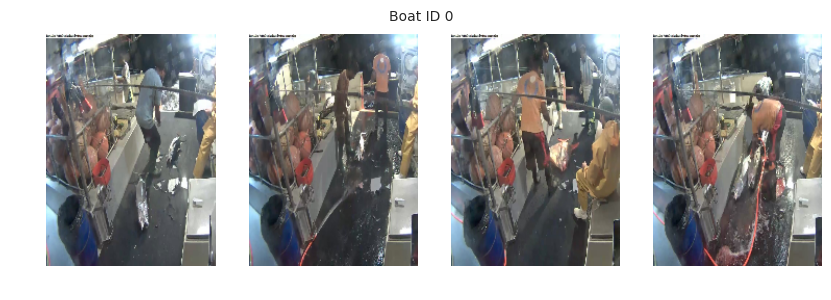

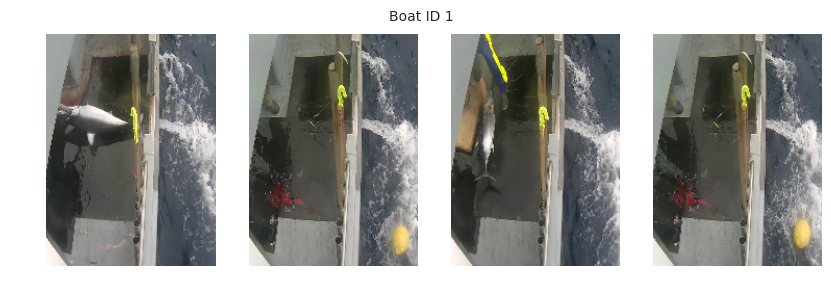

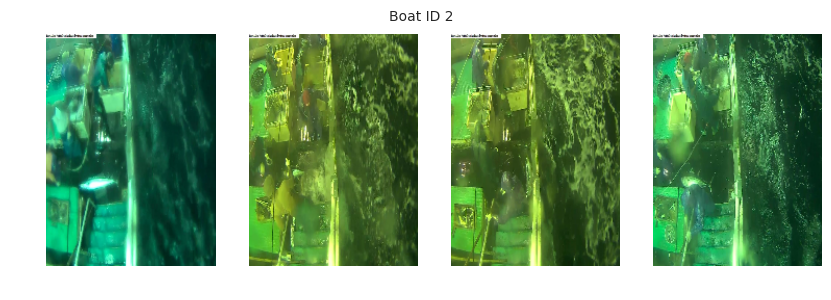

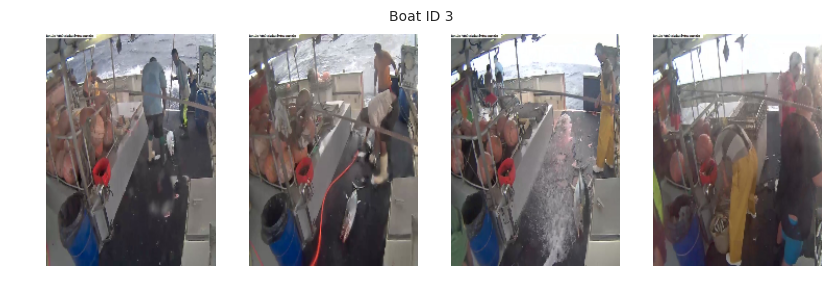

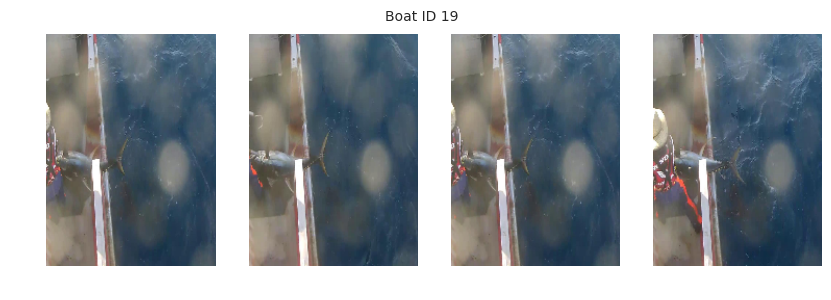

...

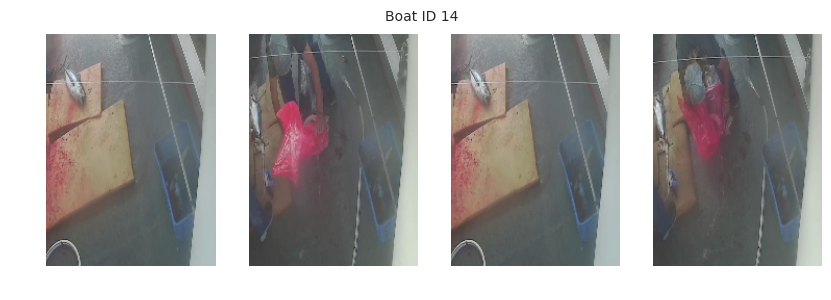

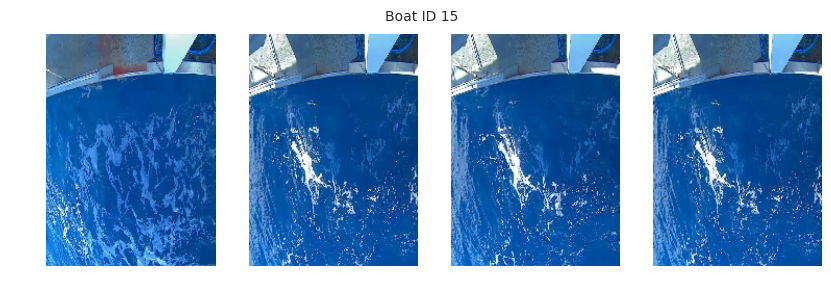

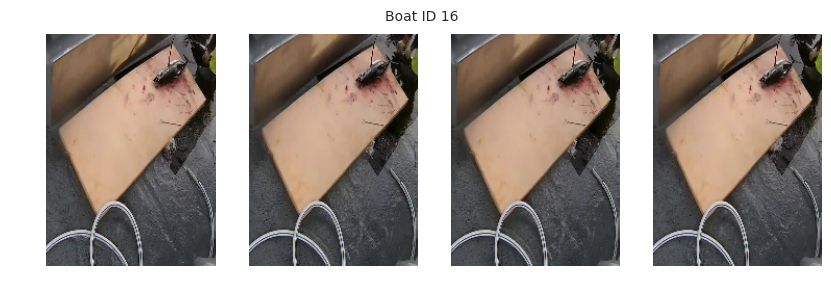

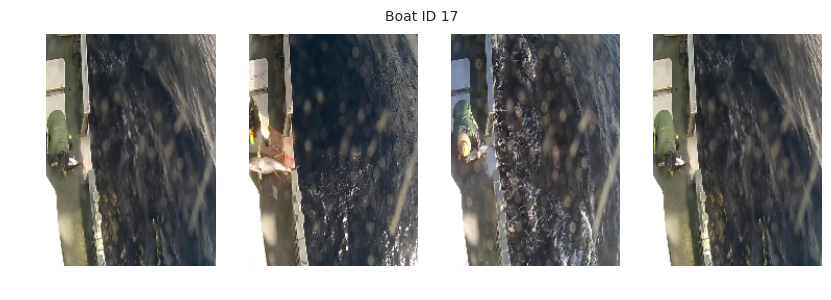

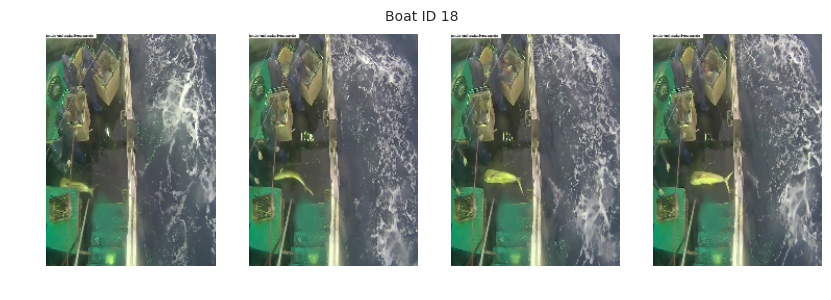

In [106]:
for pred in pd.Series(y_pred).unique():
    if pred != -1:
        #len(np.array(img_list)[y_pred == pred])
        show_img(np.array(img_list)[y_pred == pred],'Boat ID {}'.format(pred))
        plt.show()

In [182]:
img_width, img_height = 128, 128

# build the VGG16 network
model = Sequential()
model.add(ZeroPadding2D((1, 1), batch_input_shape=(3, img_width, img_height, 3)))
first_layer = model.layers[-1]
# this is a placeholder tensor that will contain our generated images
input_img = first_layer.input

# build the rest of the network
model.add(Convolution2D(64, 3, 3, activation='relu', name='conv1_1'))
model.add(ZeroPadding2D((1, 1)))
model.add(Convolution2D(64, 3, 3, activation='relu', name='conv1_2'))
model.add(MaxPooling2D((2, 2), strides=(2, 2)))

model.add(ZeroPadding2D((1, 1)))
model.add(Convolution2D(128, 3, 3, activation='relu', name='conv2_1'))
model.add(ZeroPadding2D((1, 1)))
model.add(Convolution2D(128, 3, 3, activation='relu', name='conv2_2'))
model.add(MaxPooling2D((2, 2), strides=(2, 2)))

model.add(ZeroPadding2D((1, 1)))
model.add(Convolution2D(256, 3, 3, activation='relu', name='conv3_1'))
model.add(ZeroPadding2D((1, 1)))
model.add(Convolution2D(256, 3, 3, activation='relu', name='conv3_2'))
model.add(ZeroPadding2D((1, 1)))
model.add(Convolution2D(256, 3, 3, activation='relu', name='conv3_3'))
model.add(MaxPooling2D((2, 2), strides=(2, 2)))

model.add(ZeroPadding2D((1, 1)))
model.add(Convolution2D(512, 3, 3, activation='relu', name='conv4_1'))
model.add(ZeroPadding2D((1, 1)))
model.add(Convolution2D(512, 3, 3, activation='relu', name='conv4_2'))
model.add(ZeroPadding2D((1, 1)))
model.add(Convolution2D(512, 3, 3, activation='relu', name='conv4_3'))
model.add(MaxPooling2D((2, 2), strides=(2, 2)))

model.add(ZeroPadding2D((1, 1)))
model.add(Convolution2D(512, 3, 3, activation='relu', name='conv5_1'))
model.add(ZeroPadding2D((1, 1)))
model.add(Convolution2D(512, 3, 3, activation='relu', name='conv5_2'))
model.add(ZeroPadding2D((1, 1)))
model.add(Convolution2D(512, 3, 3, activation='relu', name='conv5_3'))
model.add(MaxPooling2D((2, 2), strides=(2, 2)))

weights_path = 'vgg16_weights.h5'

f = h5py.File(weights_path)
for k in range(f.attrs['nb_layers']):
    if k >= len(model.layers):
        # we don't look at the last (fully-connected) layers in the savefile
        break
    g = f['layer_{}'.format(k)]
    weights = [g['param_{}'.format(p)] for p in range(g.attrs['nb_params'])]
    model.layers[k].set_weights(weights)
f.close()
print('Model loaded.')


layer_name = 'conv5_1'
filter_index = 0  # can be any integer from 0 to 511, as there are 512 filters in that layer

# build a loss function that maximizes the activation
# of the nth filter of the layer considered
layer_output = layer_dict[layer_name].output
loss = K.mean(layer_output[:, filter_index, :, :])

# compute the gradient of the input picture wrt this loss
grads = K.gradients(loss, input_img)[0]

# normalization trick: we normalize the gradient
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

# this function returns the loss and grads given the input picture
iterate = K.function([input_img], [loss, grads])

# we start from a gray image with some noise
input_img_data = np.random.random((3, 3, img_width, img_height)) * 20 + 128.
# run gradient ascent for 20 steps
for i in range(20):
    loss_value, grads_value = iterate([input_img_data])
    input_img_data += grads_value * step
    
    
# util function to convert a tensor into a valid image
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = x.transpose((1, 2, 0))
    x = np.clip(x, 0, 255).astype('uint8')
    return x

img = input_img_data[0]
img = deprocess_image(img)

ValueError: Layer weight shape (3, 3, 3, 64) not compatible with provided weight shape (64, 3, 3, 3)

In [162]:
with h5py.File('vgg16_weights.h5','r') as hf:
    print('List of arrays in this file: \n', hf.keys())
    data = hf.get('dataset_1')
    np_data = np.array(data)
    print('Shape of the array dataset_1: \n', np_data.shape)

List of arrays in this file: 
 KeysView(<HDF5 file "vgg16_weights.h5" (mode r+)>)
Shape of the array dataset_1: 
 ()


Start KFold number 1 from 5
Split train:  3021 3021
Split valid:  756 756
Train on 3021 samples, validate on 756 samples
Epoch 1/15
4s - loss: 1.7909 - val_loss: 2.5114
Epoch 2/15
3s - loss: 1.1429 - val_loss: 1.5158
Epoch 3/15
3s - loss: 0.9081 - val_loss: 1.3362
Epoch 4/15
3s - loss: 0.7507 - val_loss: 1.2431
Epoch 5/15
3s - loss: 0.6262 - val_loss: 1.0547
Epoch 6/15
3s - loss: 0.5299 - val_loss: 1.0162
Epoch 7/15
3s - loss: 0.4483 - val_loss: 0.9061
Epoch 8/15
3s - loss: 0.3694 - val_loss: 0.8753
Epoch 9/15
3s - loss: 0.3162 - val_loss: 0.6581
Epoch 10/15
3s - loss: 0.2672 - val_loss: 0.6941
Epoch 11/15
3s - loss: 0.2207 - val_loss: 0.6662
Epoch 12/15
3s - loss: 0.1995 - val_loss: 0.8489
Epoch 13/15
3s - loss: 0.1660 - val_loss: 0.7495
Score log_loss:  0.749525735945
Start KFold number 2 from 5
Split train:  3021 3021
Split valid:  756 756
Train on 3021 samples, validate on 756 samples
Epoch 1/15
3s - loss: 0.2427 - val_loss: 0.4358
Epoch 2/15
3s - loss: 0.2020 - val_loss: 0.3034
Ep

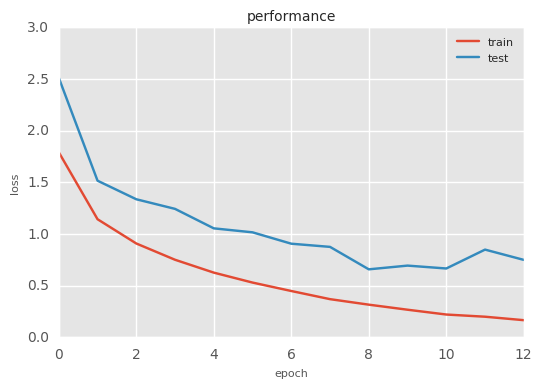

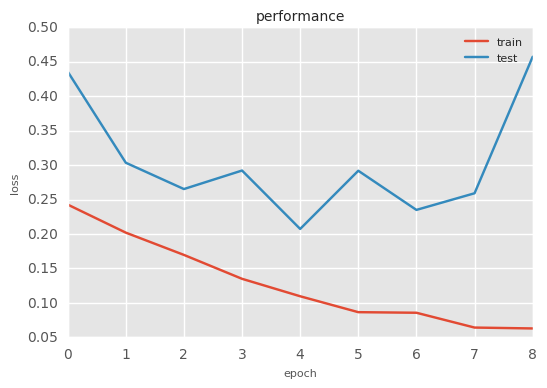

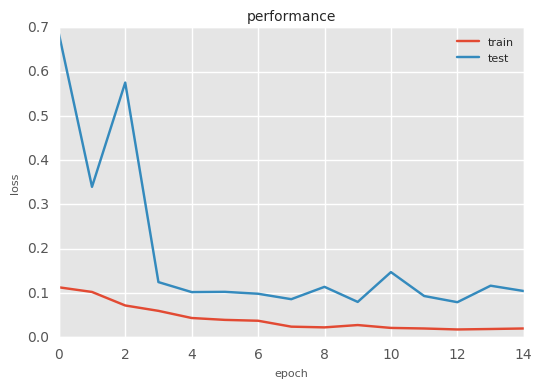

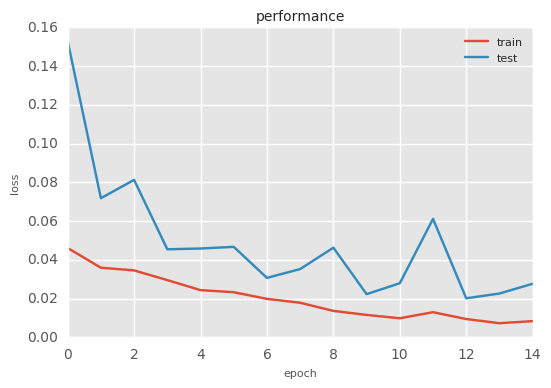

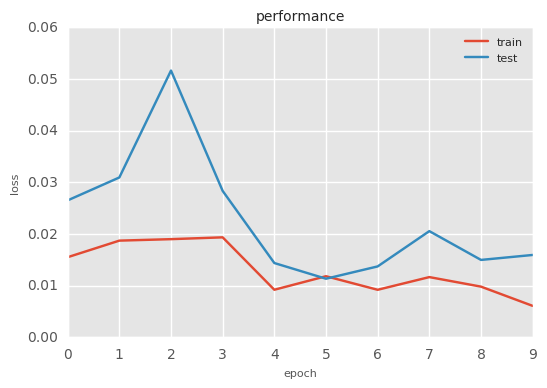

In [110]:
num_folds = 5
cnn = cnn_batch()
info_string, models, hists = run_cross_validation_create_models(cnn, train_data_, train_target_, train_id_, num_folds)
#run_cross_validation_process_test(info_string, models, test_data_, test_id_)

for cur_model in hists:
    res_vis(cur_model, "loss")

In [ ]:
num_folds = 5
cnn = cnn_batch()
info_string, models, hists = run_cross_validation_create_models(cnn, train_data_, train_target_, train_id_, num_folds)
#run_cross_validation_process_test(info_string, models, test_data_, test_id_)

for cur_model in hists:
    res_vis(cur_model, "loss")